<a href="https://colab.research.google.com/github/hamdjalil/gitestnew/blob/master/Hamd_testing_Aleph2Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*# даLL-E x CLIP*

Aleph2Image by @Advadnoun aka Ryan Murdoch - Visit [here](https://www.patreon.com/patronizeme) and make the decision to support these notebook developments into the cutting edge. 
______________
---
###Notebook Modified by Fractal DNA
---



In [1]:
#@title  <== FIRST TIME?  *RUN* then restart  Runtime* 

import subprocess

CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("utf-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
print("CUDA version:", CUDA_version)

if CUDA_version == "10.0":
    torch_version_suffix = "+cu100"
elif CUDA_version == "10.1":
    torch_version_suffix = "+cu101"
elif CUDA_version == "10.2":
    torch_version_suffix = ""
else:
    torch_version_suffix = "+cu110"

!pip install torch==1.7.1{torch_version_suffix} torchvision==0.8.2{torch_version_suffix} -f https://download.pytorch.org/whl/torch_stable.html ftfy regex

CUDA version: 11.0
Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [2]:
#@title Capacitating Genetic Modifiers

import torch
import numpy as np
import torchvision
import torchvision.transforms.functional as TF

import PIL
import matplotlib.pyplot as plt

import os
import random
import imageio
from IPython import display
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import torch.contrib
import glob

from google.colab import output



In [3]:
#@title Preparing Captive Simulators  
%cd /content/
!git clone https://github.com/openai/DALL-E.git
!git clone https://github.com/openai/CLIP.git
!pip install git+https://github.com/openai/CLIP.git
!pip install git+https://github.com/openai/DALL-E.git



import os
from google.colab import files
import torch
import numpy as np

from CLIP import clip
from dall_e import utils, encoder, decoder

dev = torch.device('cuda:0')

# Load the model
perceptor, preprocess = clip.load('ViT-B/32', dev, jit=True)
perceptor = perceptor.train() #or .eval() instead of .train()

/content
fatal: destination path 'DALL-E' already exists and is not an empty directory.
fatal: destination path 'CLIP' already exists and is not an empty directory.
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-hklg9scw
  Running command git clone -q https://github.com/openai/CLIP.git /tmp/pip-req-build-hklg9scw
  Created wheel for clip: filename=clip-1.0-cp37-none-any.whl size=1368722 sha256=6a0a8e53bfcc2dcc2d601b1922a2b53494de8642a0b7bcb3ed46fe203201f725
  Stored in directory: /tmp/pip-ephem-wheel-cache-2lfocgzx/wheels/79/51/d7/69f91d37121befe21d9c52332e04f592e17d1cabc7319b3e09
Successfully built clip
  Cloning https://github.com/openai/DALL-E.git to /tmp/pip-req-build-231_d_vh
  Running command git clone -q https://github.com/openai/DALL-E.git /tmp/pip-req-build-231_d_vh
  Created wheel for DALL-E: filename=DALL_E-0.1-cp37-none-any.whl size=6011 sha256=90111d2a8538c1fec866596ced82453a1125f79d416aea7d8376bd6aaa0190fc
  Stored in directory: /tmp/pip-ephem-wheel-ca

/usr/local/lib/python3.7/dist-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.5) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [4]:
#@title Chlorinating Car Pools
im_shape = [512, 512, 3]
sideX, sideY, channels = im_shape

def displ(img, pre_scaled=True):
  img = np.array(img)[:,:,:]
  img = np.transpose(img, (1, 2, 0))
  if not pre_scaled:
    img = scale(img, 32*4, 32*4)
  imageio.imwrite(str(3) + '.png', np.array(img))
  return display.Image(str(3)+'.png')

def gallery(array, ncols=16):
    nindex, height, width, intensity = array.shape
    nrows = nindex//ncols
    assert nindex == nrows*ncols
    # want result.shape = (height*nrows, width*ncols, intensity)
    result = (array.reshape(nrows, ncols, height, width, intensity)
              .swapaxes(1,2)
              .reshape(height*nrows, width*ncols, intensity))
    return result

def card_padded(im, to_pad=2):
  return np.pad(np.pad(np.pad(im, [[1,1], [1,1], [0,0]],constant_values=0), [[2,2], [2,2], [0,0]],constant_values=1),
            [[to_pad,to_pad], [to_pad,to_pad], [0,0]],constant_values=0)

def get_all(img):
  img = np.transpose(img, (0,2,3,1))
  cards = np.zeros((img.shape[0], sideX+12, sideY+12, 3))
  for i in range(len(img)):
    cards[i] = card_padded(img[i])
  print(img.shape)
  cards = gallery(cards)
  imageio.imwrite(str(3) + '.png', np.array(cards))
  return display.Image(str(3)+'.png')
  

In [5]:
#@title Reticulating 3 1-dimensional-splines

import io
import os, sys
import requests
import PIL

import torch
import torchvision.transforms as T
import torchvision.transforms.functional as TF

%cd DALL-E

from dall_e import map_pixels, unmap_pixels, load_model
target_image_size = sideX

def preprocess(img):
    s = min(img.size)
    
    if s < target_image_size:
        raise ValueError(f'min dim for image {s} < {target_image_size}')
        
    r = target_image_size / s
    s = (round(r * img.size[1]), round(r * img.size[0]))
    img = TF.resize(img, s, interpolation=PIL.Image.LANCZOS)
    img = TF.center_crop(img, output_size=2 * [target_image_size])
    img = torch.unsqueeze(T.ToTensor()(img), 0)
    return map_pixels(img)

dev = torch.device('cuda:0')

model = load_model("https://cdn.openai.com/dall-e/decoder.pkl", dev)

enc = load_model("https://cdn.openai.com/dall-e/encoder.pkl", dev)



#x = (torch.zeros(1, 3, 512, 512))


#z_logits = enc(x.to(dev))
#z = torch.argmax(z_logits, axis=1)
#z = torch.nn.functional.one_hot(z, num_classes=enc.vocab_size).permute(0, 3, 1, 2).float()

%cd /content/

/content/DALL-E
/content


In [9]:
#@title 1. Enter Text

text_input = "A mannequin  wearing a black jacket and a golden skirt " #@param {type:"string"}


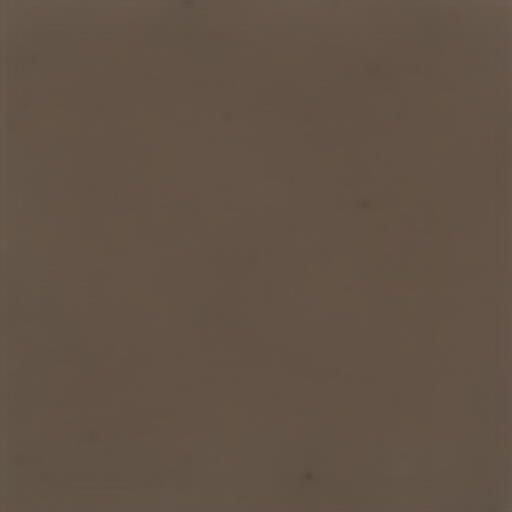



torch.return_types.topk(
values=tensor([[[0.0228, 0.0210, 0.0208,  ..., 0.0015, 0.0015, 0.0014],
         [0.0189, 0.0138, 0.0089,  ..., 0.0017, 0.0017, 0.0017],
         [0.0160, 0.0116, 0.0110,  ..., 0.0015, 0.0015, 0.0015],
         ...,
         [0.0147, 0.0143, 0.0130,  ..., 0.0017, 0.0016, 0.0016],
         [0.1870, 0.0187, 0.0168,  ..., 0.0012, 0.0012, 0.0012],
         [0.0330, 0.0181, 0.0093,  ..., 0.0015, 0.0015, 0.0015]]],
       device='cuda:0'),
indices=tensor([[[ 315, 1514, 3953,  ..., 2904, 4077,  734],
         [2346,  445, 1277,  ..., 2194, 1327, 1848],
         [2722, 2806, 1149,  ..., 3698, 1380,  987],
         ...,
         [1583, 2352, 1789,  ...,  460, 3804, 1661],
         [1211, 1758, 2411,  ...,  634, 1147, 1463],
         [3230, 2123, 4006,  ..., 2552, 2632, 1100]]], device='cuda:0'))


In [10]:
#@title ###2 <---- Normu the Latent Phase-Space

class Pars(torch.nn.Module):
    def __init__(self):
        super(Pars, self).__init__()
        self.normu = torch.nn.Parameter(torch.randn(1, 8192, 64, 64).to(dev))


    def forward(self):
        normu = torch.nn.functional.gumbel_softmax(self.normu.view(1, 8192, -1), tau=1.7, dim=-1).view(1, 8192, 64, 64)
        return normu


lats = Pars().cuda()
mapper = [lats.normu]
optimizer = torch.optim.Adam([{'params': mapper, 'lr': .1}])
eps = 4


tx = clip.tokenize(text_input)
t = perceptor.encode_text(tx.to(dev)).detach().clone()


nom = torchvision.transforms.Normalize((0.58145466, 0.5578275, 0.50821073), (0.26862954, 0.26130258, 0.27577711))

with torch.no_grad():
  mult = 1
  al = unmap_pixels(torch.sigmoid(model(lats()).cpu().float())).numpy()
  for allls in al:
    displ(allls[:3])
    print('\n')
    print(torch.topk(lats().view(1, 8192, -1), k=64, dim=-1))


# ***Image Generation***

0 [0, tensor([-17.1250], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



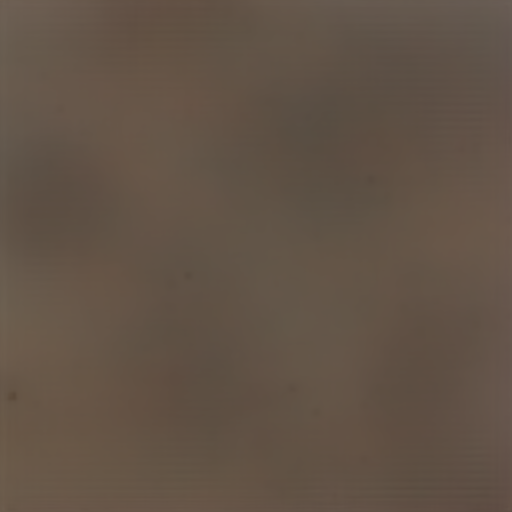



10 [0, tensor([-19.3906], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



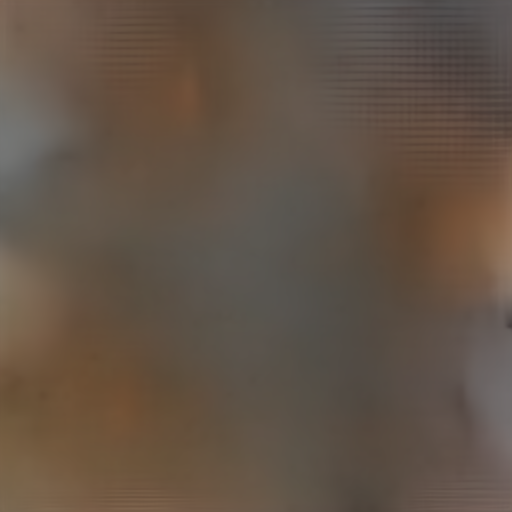



20 [0, tensor([-21.6875], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



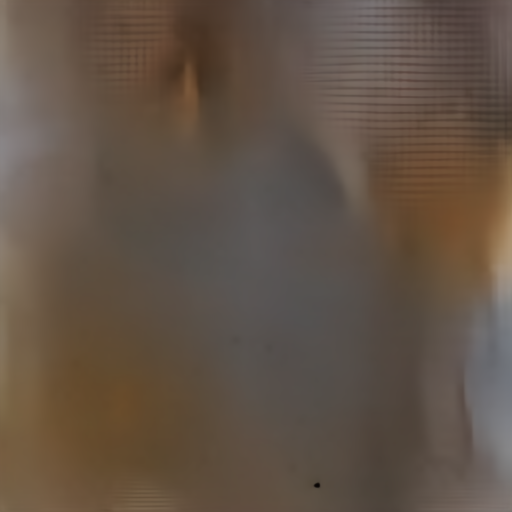



30 [0, tensor([-24.3594], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



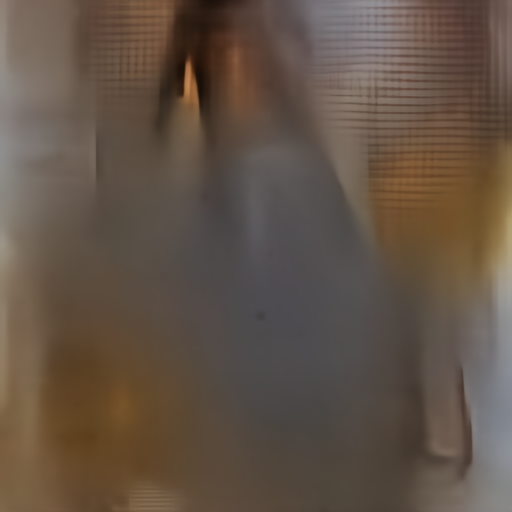



40 [0, tensor([-27.6875], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



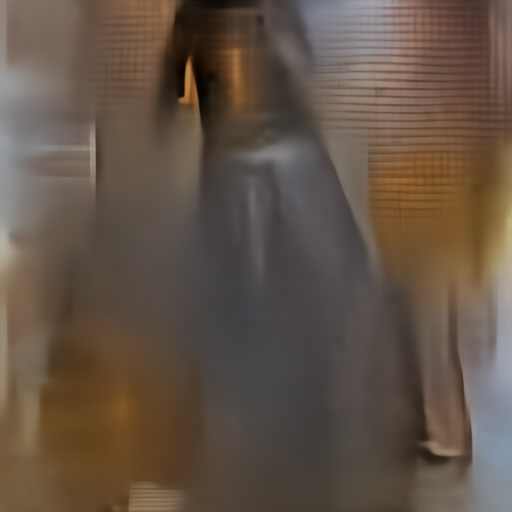



50 [0, tensor([-31.1094], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



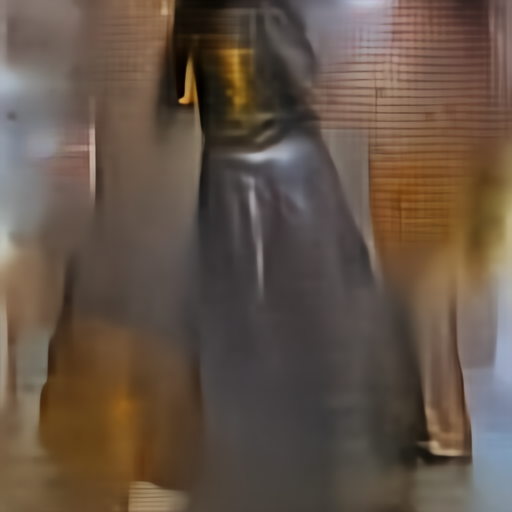



60 [0, tensor([-32.5312], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



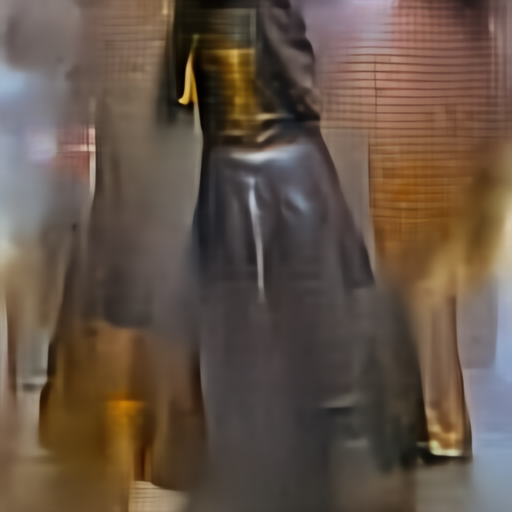



70 [0, tensor([-37.3125], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



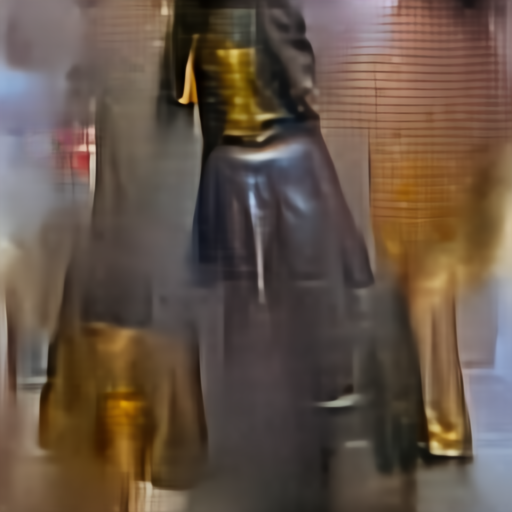



80 [0, tensor([-36.6875], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



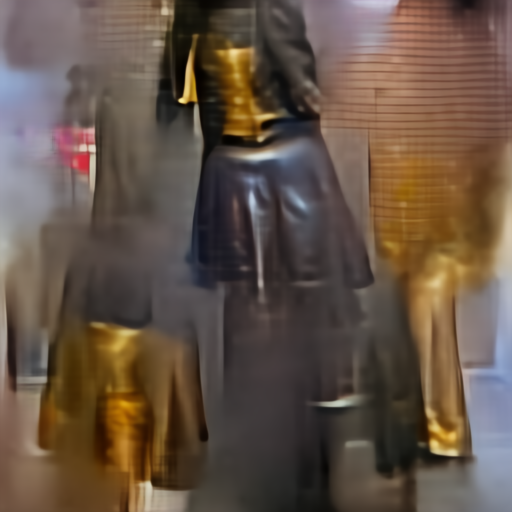



90 [0, tensor([-41.4375], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



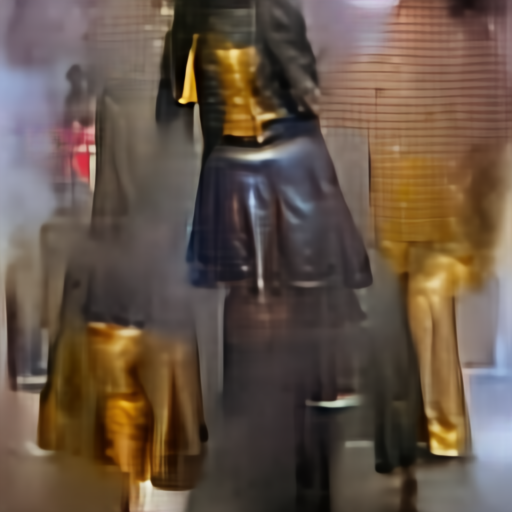



100 [0, tensor([-41.5000], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



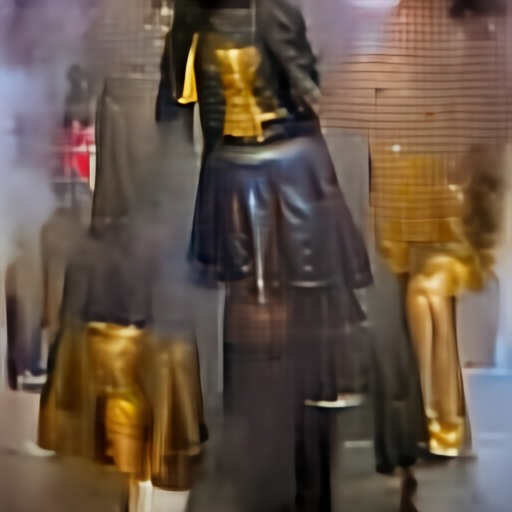



110 [0, tensor([-41.0312], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



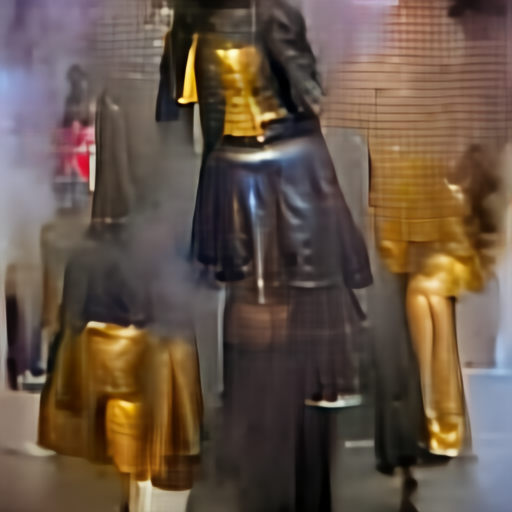



120 [0, tensor([-43.1875], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



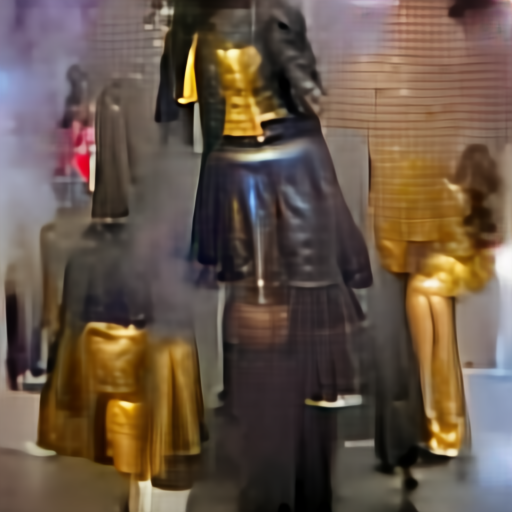



130 [0, tensor([-43.0312], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



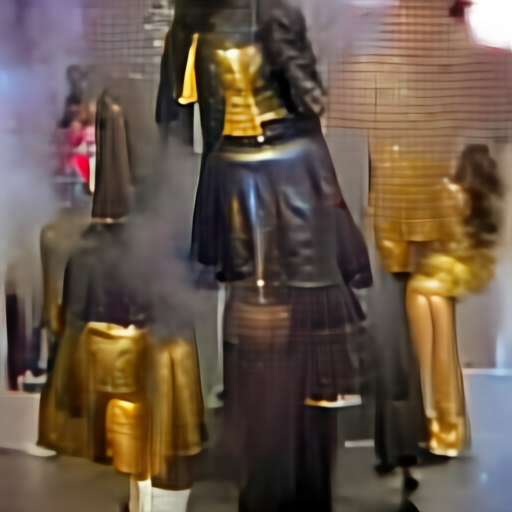



140 [0, tensor([-44.7188], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



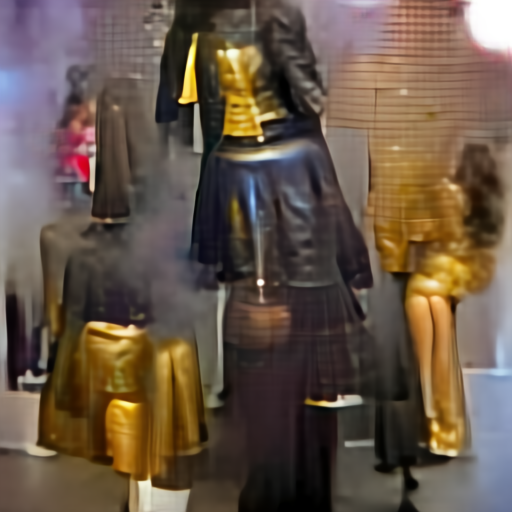



150 [0, tensor([-45.3125], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



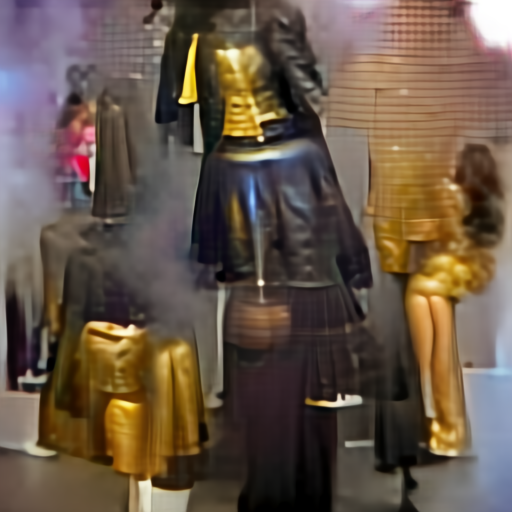



160 [0, tensor([-47.1562], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



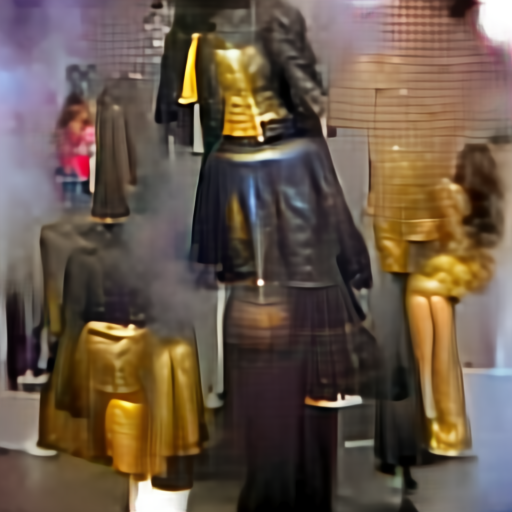



170 [0, tensor([-45.8125], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



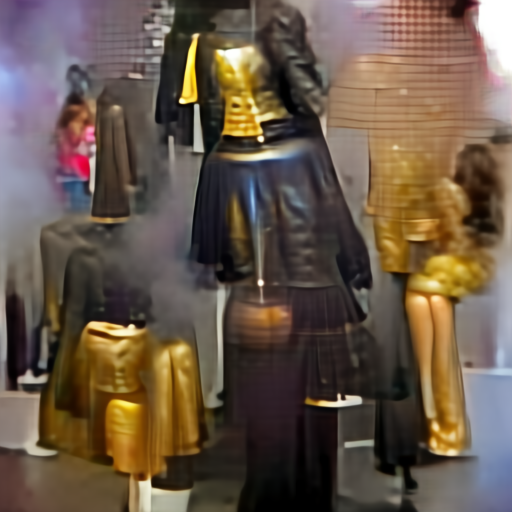



180 [0, tensor([-46.7188], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



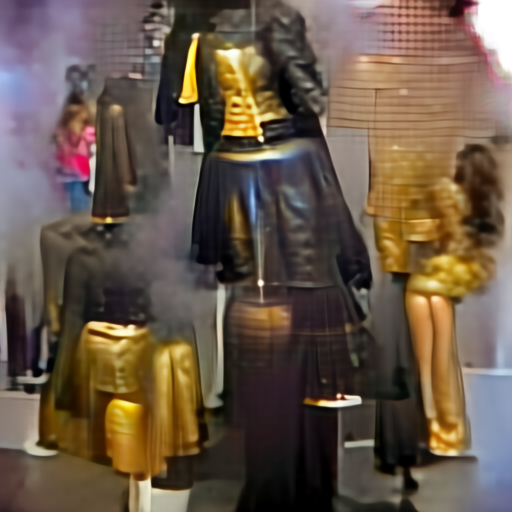



190 [0, tensor([-49.9375], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



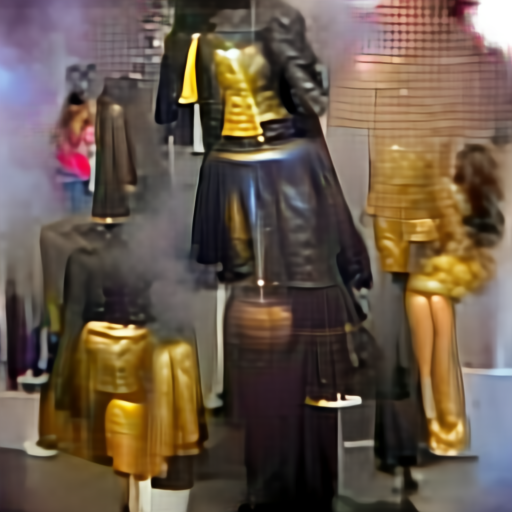



200 [0, tensor([-46.], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



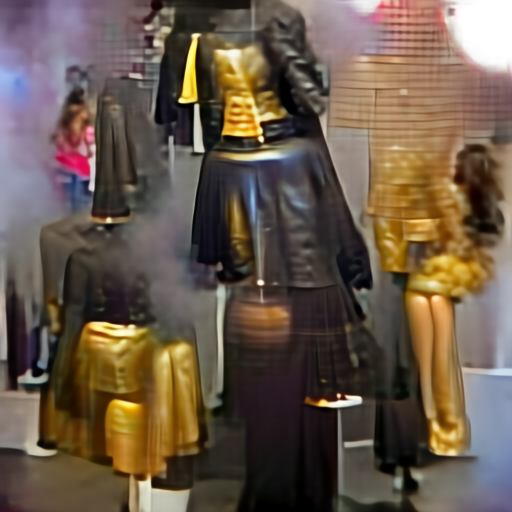



210 [0, tensor([-47.8750], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



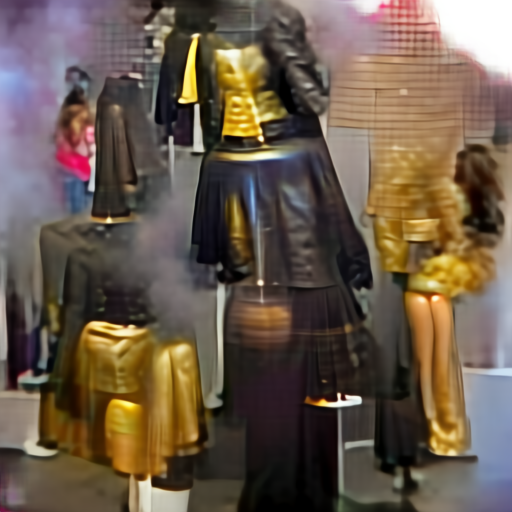



220 [0, tensor([-49.1250], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



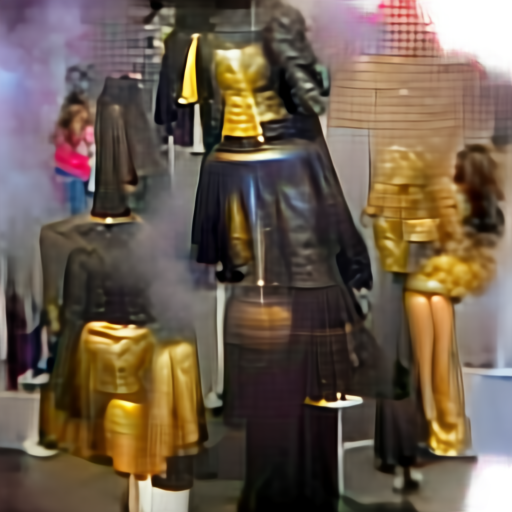



230 [0, tensor([-47.1562], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



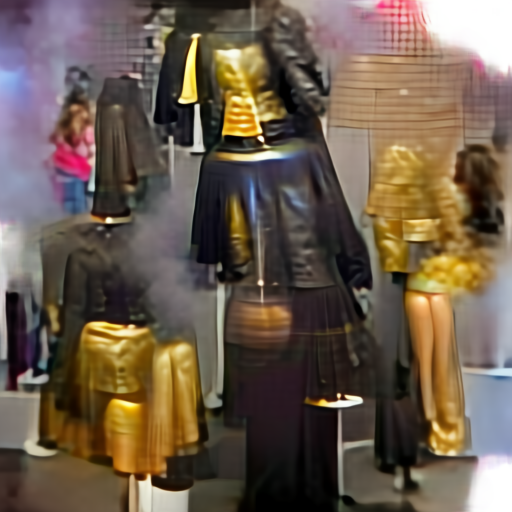



240 [0, tensor([-49.0625], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



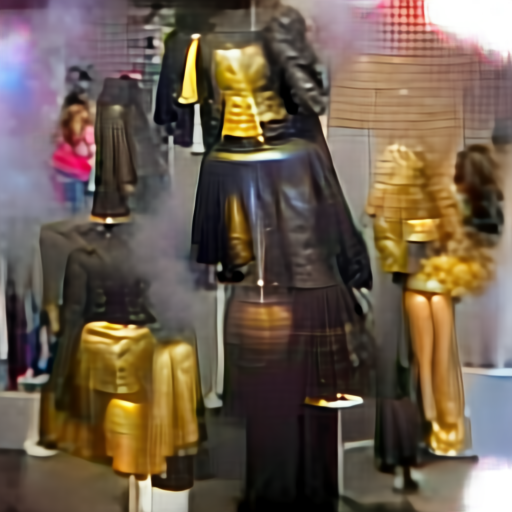



250 [0, tensor([-50.1562], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



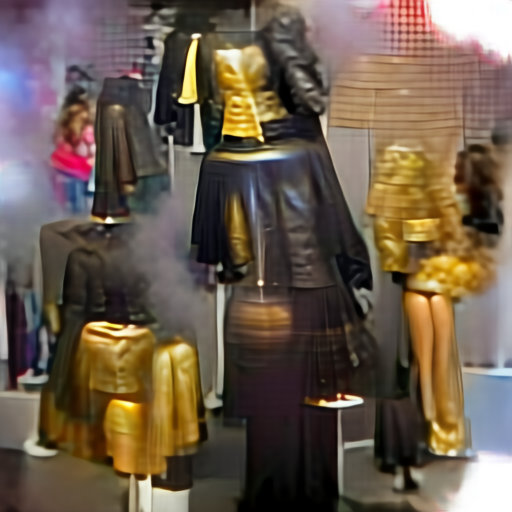



260 [0, tensor([-49.3750], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



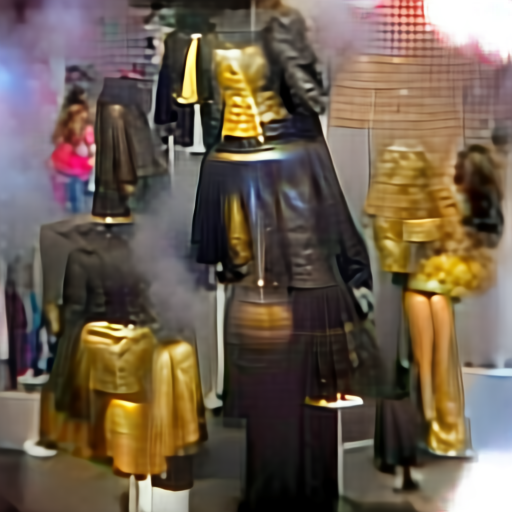



270 [0, tensor([-49.8750], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



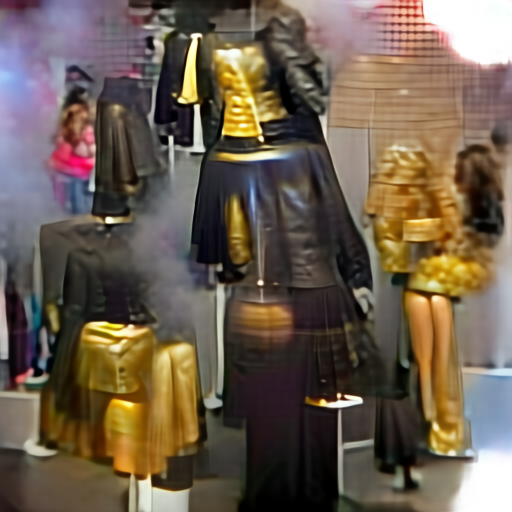



280 [0, tensor([-47.5312], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



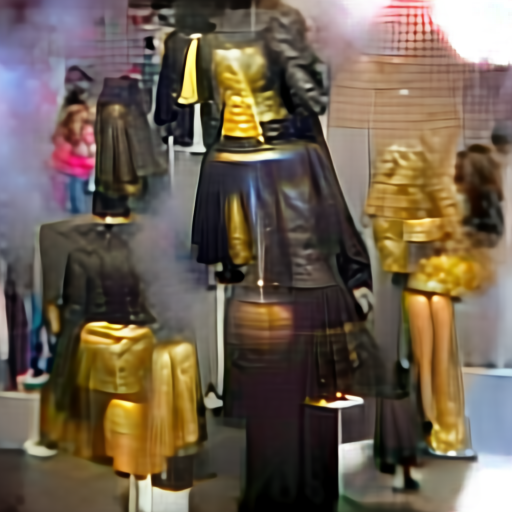



290 [0, tensor([-49.0625], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



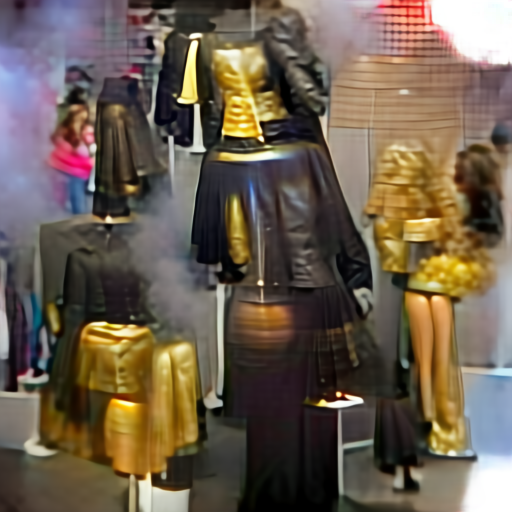



300 [0, tensor([-49.7188], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



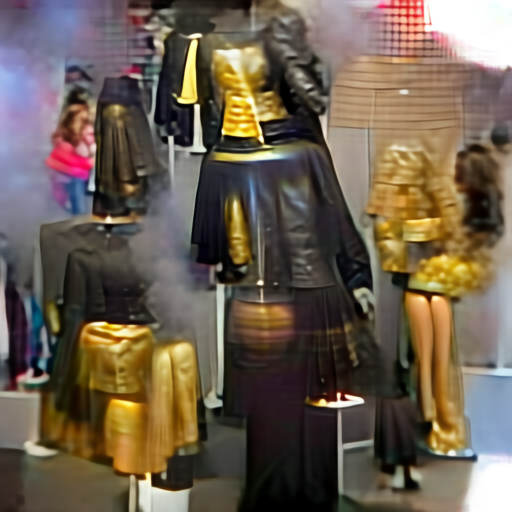



310 [0, tensor([-52.2812], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



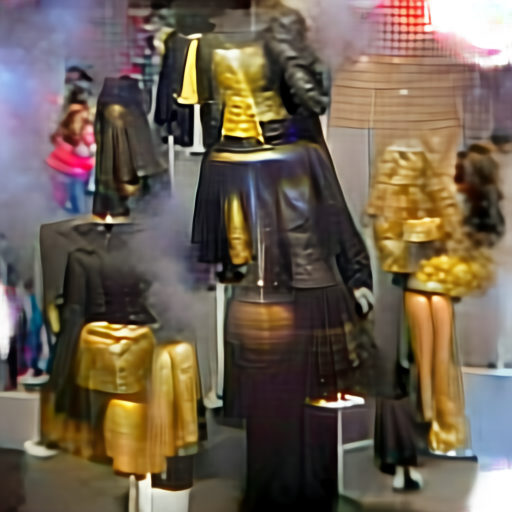



320 [0, tensor([-48.6875], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



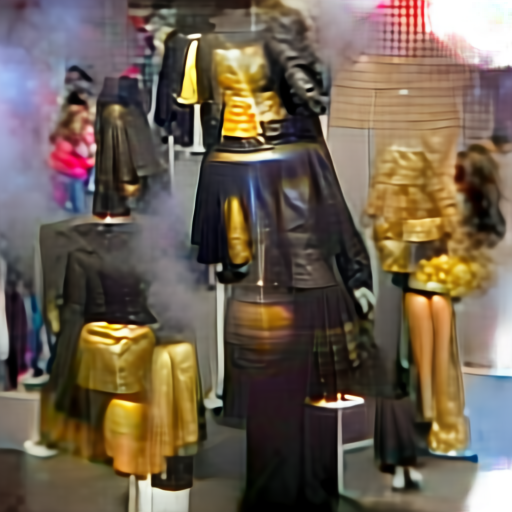



330 [0, tensor([-51.1250], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



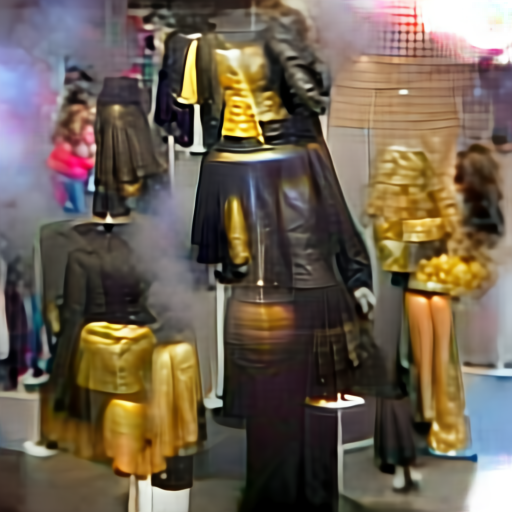



340 [0, tensor([-51.0312], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



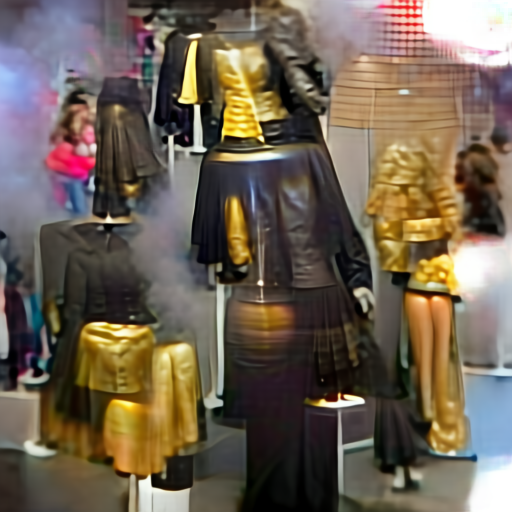



350 [0, tensor([-51.2812], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



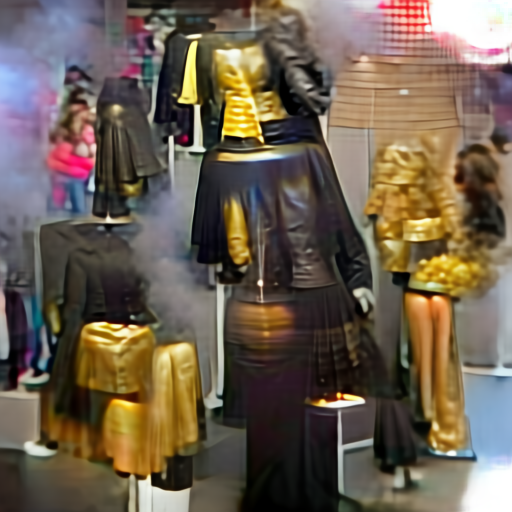



360 [0, tensor([-52.6250], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



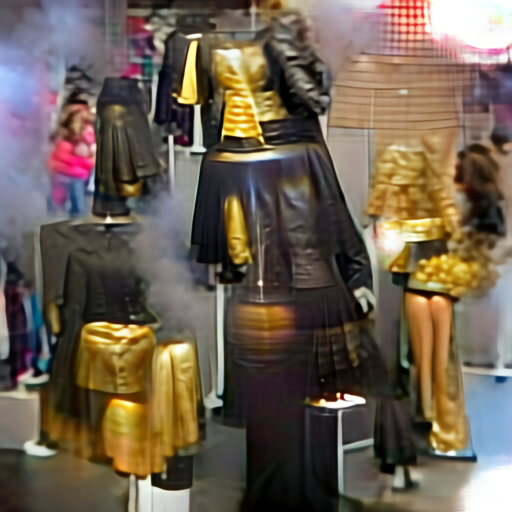



370 [0, tensor([-52.1562], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



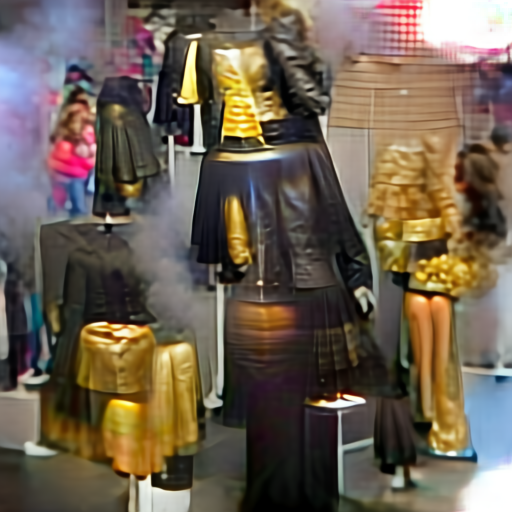



380 [0, tensor([-49.5000], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



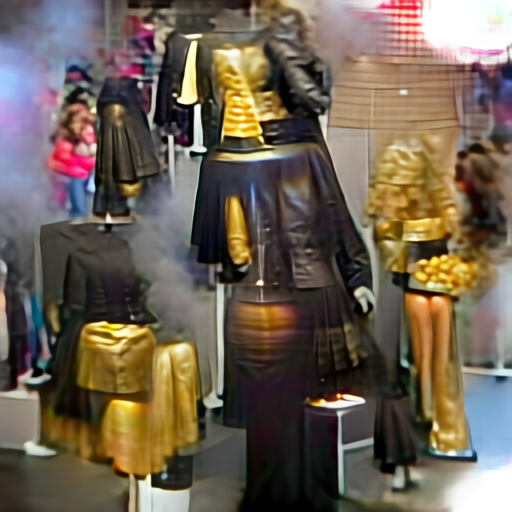



390 [0, tensor([-49.6562], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



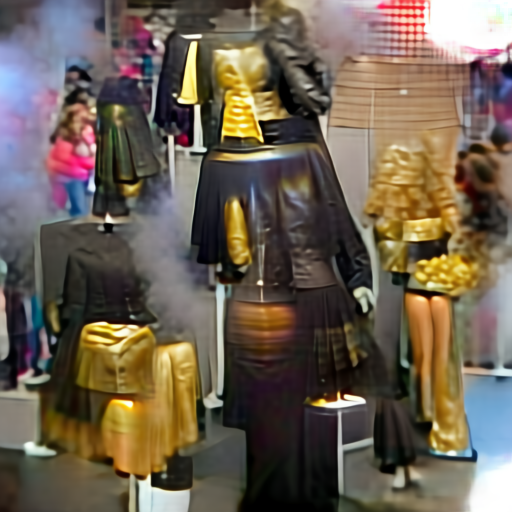



400 [0, tensor([-51.5000], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



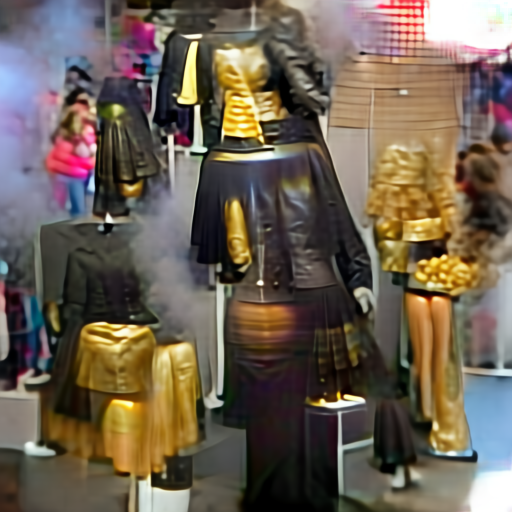



410 [0, tensor([-50.7188], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



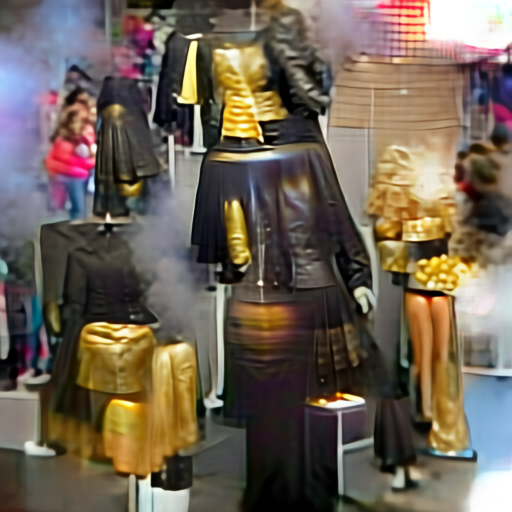



420 [0, tensor([-51.6562], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



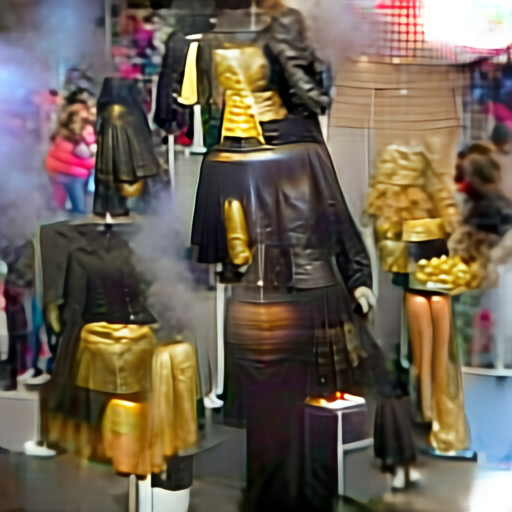



430 [0, tensor([-52.3438], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



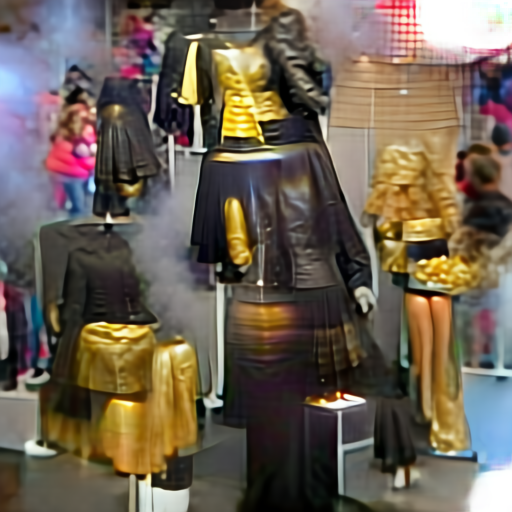



440 [0, tensor([-54.9688], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



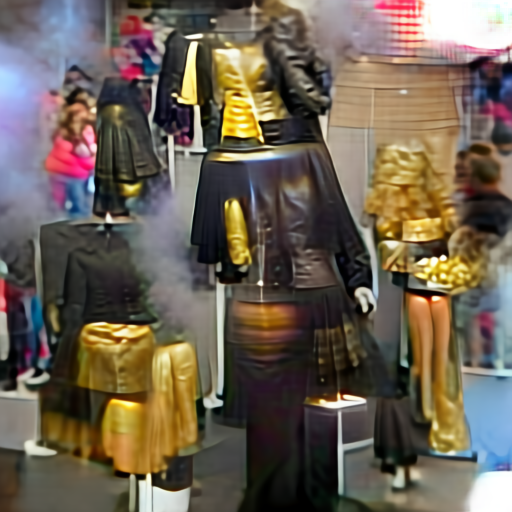



450 [0, tensor([-51.5625], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



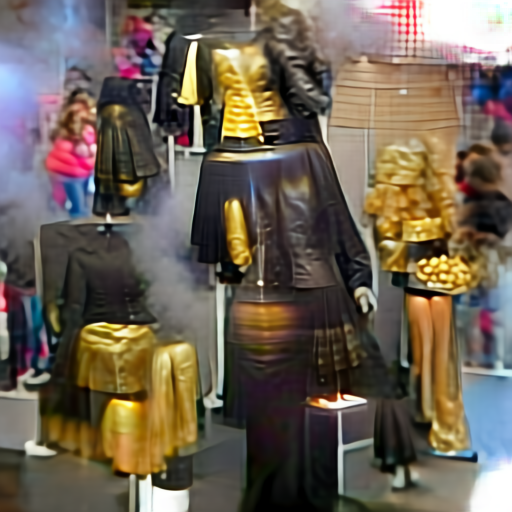



460 [0, tensor([-50.3438], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



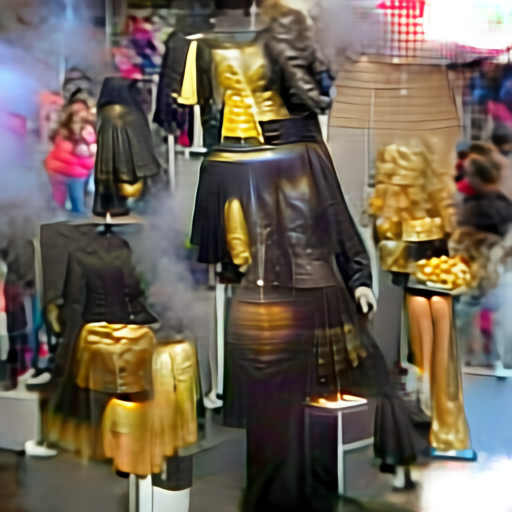



470 [0, tensor([-52.8750], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



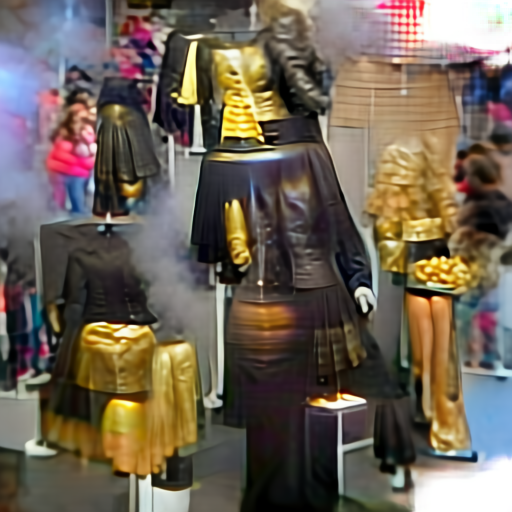



480 [0, tensor([-50.5938], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



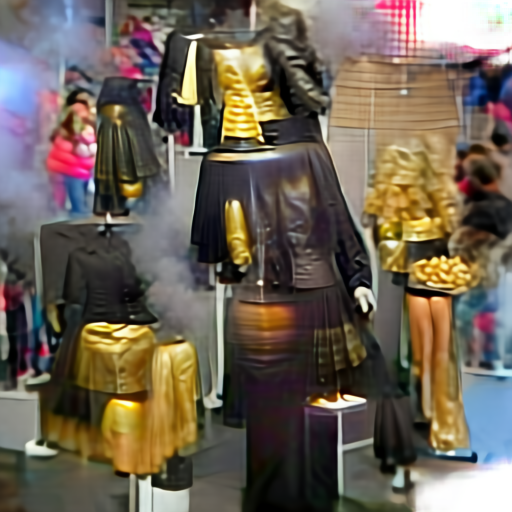



490 [0, tensor([-51.7188], device='cuda:0', dtype=torch.float16,
       grad_fn=<MulBackward0>)] 
 A mannequin  wearing a black jacket and a golden skirt  



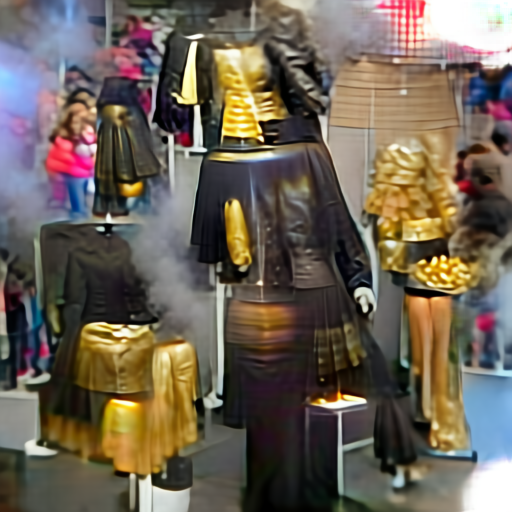

In [ ]:
#@title #### <---  3 ---  Generate Images { vertical-output: true, form-width: "30%", display-mode: "both" }

def checkin(loss):
  print(itt, loss,'\n', text_input,'\n') 
  with torch.no_grad():
    al = unmap_pixels(torch.sigmoid(model(lats())[:, :3]).cpu().float()).numpy()
  for allls in al:
    nom
    displ(allls)
    display.display(display.Image(str(3)+'.png'))
    print('\n')

 
 
def ascend_txt():
  out = unmap_pixels(torch.sigmoid(model(lats())[:, :3].float())) 
  mean=0.323 #@param {type:"slider", min:0.001, max:1, step:0.001}
  std = 0.837 #@param {type:"slider", min:0.001, max:1, step:0.001}

  tau = 1.733 #@param {type:"slider", min:0.5, max:16, step:0.001}
  min = 0.05 #@param {type:"slider", min:0.05, max:0.5, step:0.0001}
  max = 0.7992 #@param {type:"slider", min:0.5, max:0.98, step:0.0001}

  cutn = 32 #@param {type:"slider", min:1, max:128, step:1}
  cutn = 32
  p_s = []
  for  ch in range(cutn):
    size = int(sideX*torch.zeros(1).normal_(mean, std=.86).clip(.3, .80))
    offsetx = torch.randint(0, sideX - size, ())
    offsety = torch.randint(0, sideX - size, ())
    apper = out[:, :, offsetx:offsetx + size, offsety:offsety + size]
    apper = torch.nn.functional.interpolate(apper, (224,224), mode='nearest')
    p_s.append(apper)
  into = torch.cat(p_s, 0)
  
  into = nom((into + 1) / tau)
  
  iii = perceptor.encode_image(into)
 
  llls = lats()
  lat_l = 0
 
  return [lat_l, 100*-torch.cosine_similarity(t, iii).view(-1, 1).T.mean(1)]

  

def train(i):
  loss1 = ascend_txt()
  loss = loss1[0] + loss1[1]
  loss = loss.mean()
  optimizer.zero_grad( )
  loss.backward(retain_graph=False)
  optimizer.step()

  g_lr = 0.1325 #@param {type:"slider", min:0.0005, max:0.95, step:0.0005}
  up_noise = 0.03893 #@param {type:"slider", min:0.00001, max:0.99999, step:0.00001}
  

  if itt % 10 == 0:
    checkin(loss1)

iterations = 10000 #@param {type:"number"} 
 
itt = 0
for asatreat in range(iterations):
  train(itt)
  itt+=1

In [ ]:
dev = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

image_input = 'image.jpg'
PIL.Image.open(image_input)
img = 2.*img - 1.
img = img.to(dev)
iii = perceptor.encode_image(iii)